In this page, 10x Visium data from 18 PCW pancreas were processed, and scRNAseq data with cell types prediction from Seurat were incorporated to enable cell type visualisation per spatial spot. Spatial trajectory inferences were also carried out.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U stlearn scanpy louvain python-igraph
 

In [ ]:
# import module
import stlearn as st
import scanpy as sc 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
st.settings.set_figure_params(dpi=180)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# Processing 18 PCW pancreas
# specify PATH to data
BASE_PATH = Path("/content/drive/MyDrive/spatial/18a/")

# spot tile is the intermediate result of image pre-processing
TILE_PATH = Path("/tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)

# output path
OUT_PATH = Path("content/drive/MyDrive/spatial/results/")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [ ]:
#Load 18PCW pancreas 10x Visium data
adata = st.Read10X(path=BASE_PATH)
adata.var_names_make_unique()
st.pp.filter_genes(adata,min_cells=3)
st.pp.normalize_total(adata)
st.pp.log1p(adata)
st.pp.scale(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


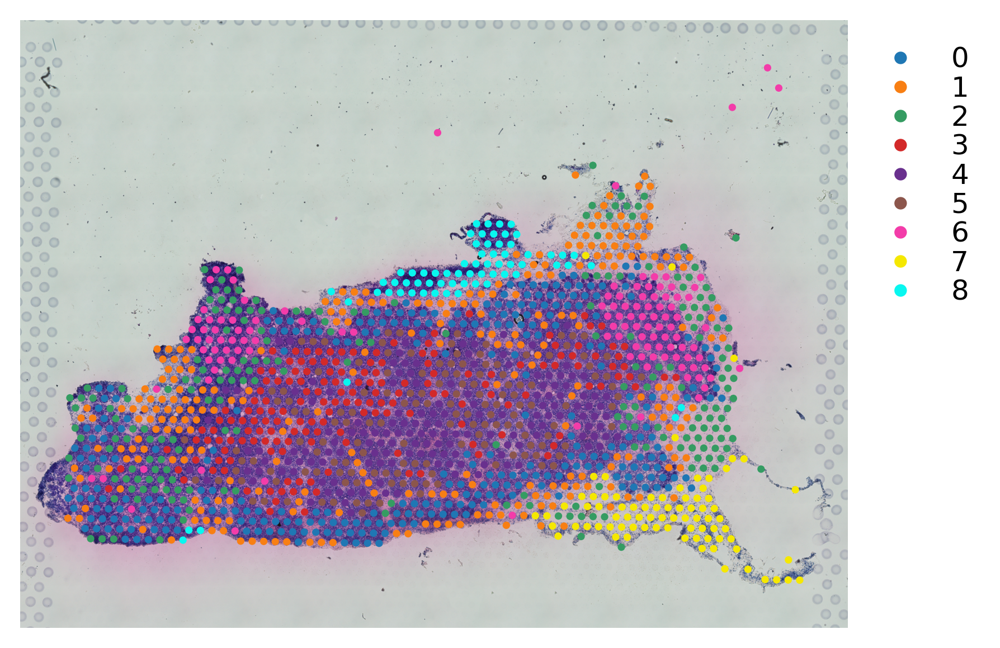

In [ ]:
st.em.run_pca(adata,n_comps=10,random_state=0)
st.pp.neighbors(adata,n_neighbors=15,use_rep='X_pca',random_state=0)
st.tl.clustering.louvain(adata,random_state=0)
st.pl.cluster_plot(adata,use_label="louvain",image_alpha=1,size=7)

Visualising scRNA-seq cell labelling on the spatial slides. The cell types deconvolution was obtained from Seurat processing of the spatial data and from incorporating scRNAseq data from Olaniru and Yu etal 2021


In [ ]:
label = pd.read_csv('/content/drive/MyDrive/spatial/deconvolution_18a_result.csv', index_col=0)

In [ ]:
common_barcode  = list(set(adata.obs_names) & set(label.columns))

In [ ]:
label = label[common_barcode]
adata = adata[common_barcode,:]

In [ ]:
label = label[adata.obs_names]
adata.obsm["deconvolution"] = label[adata.obs.index].T

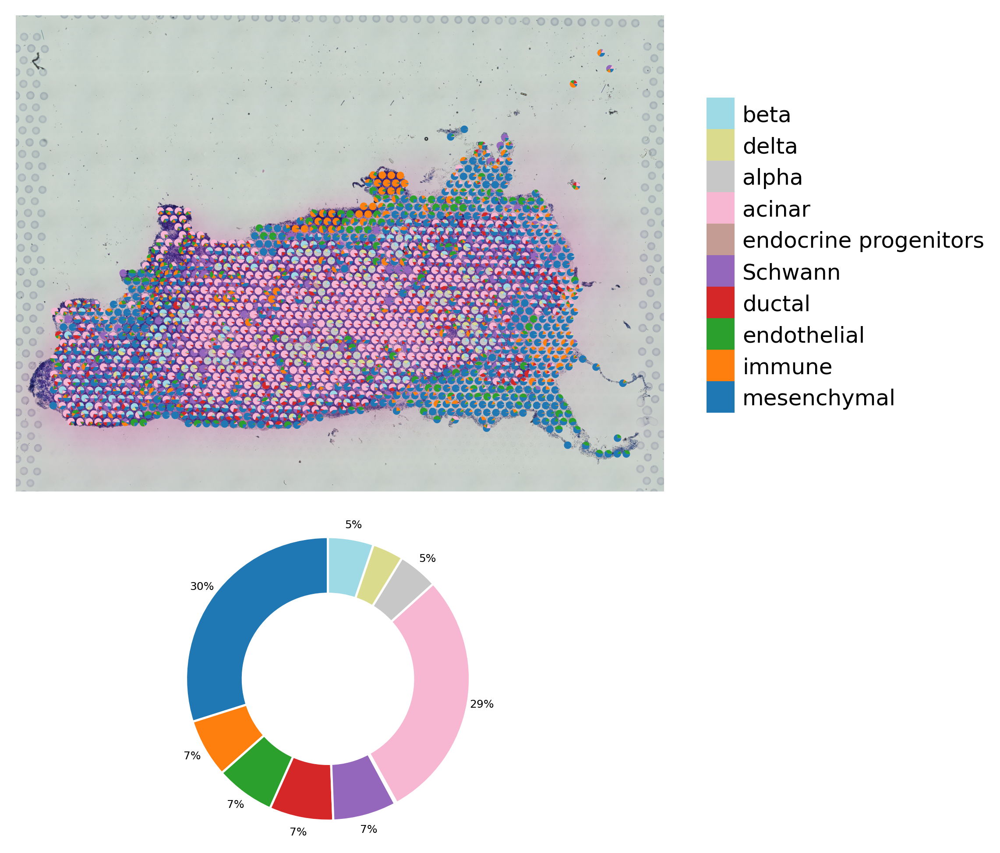

In [ ]:
st.pl.deconvolution_plot(adata,threshold=0.0)

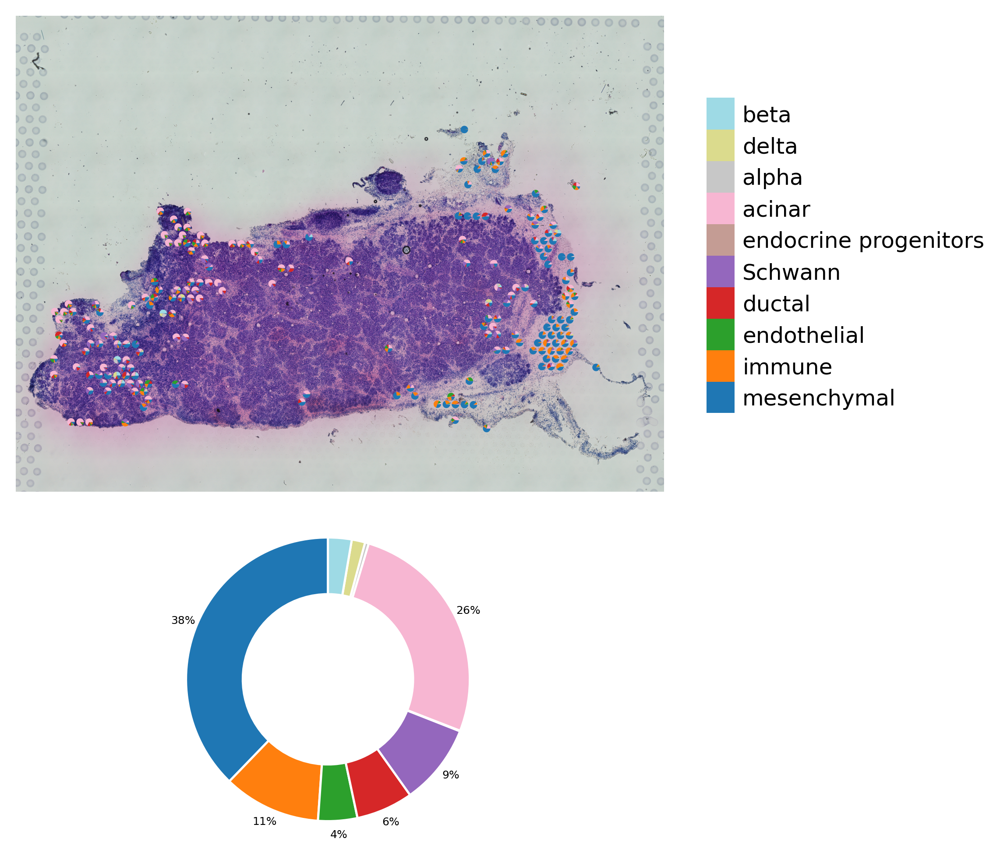

In [ ]:

st.pl.deconvolution_plot(adata,cluster=2)


In [ ]:
adata

AnnData object with n_obs × n_vars = 1489 × 18534
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow', 'louvain', 'sub_cluster_labels', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'spatial', 'log1p', 'pca', 'neighbors', 'louvain', 'louvain_colors', 'iroot', 'paga', 'louvain_sizes', 'diffmap_evals', 'threshold_spots', 'split_node', 'global_graph', 'centroid_dict', 'PTS_graph', 'screening_result_global', 'clade_8', 'clade_21', 'clade_9'
    obsm: 'spatial', 'X_pca', 'deconvolution', 'X_diffmap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
result =adata.var_names

In [ ]:
pd.DataFrame(result).to_csv('out.csv')

In [ ]:
#Spatial trajectory of the mesenchyme cluster

adata.uns["iroot"] = np.flatnonzero(adata.obs["louvain"]  == str(2))[50]
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca")

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


/usr/local/lib/python3.7/dist-packages/stlearn/spatials/trajectory/pseudotime.py:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))
/usr/local/lib/python3.7/dist-packages/stlearn/spatials/trajectory/pseudotime.py:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  v = np.array(list(dic.values()))


Screening PTS global graph...


Screening: 100%|██████████ [ time left: 00:00 ]


Calculate the graph dissimilarity using Laplacian matrix...


Calculating: 100%|██████████ [ time left: 00:00 ]


The optimized weighting is: 0.86
Start to construct the trajectory: 2 -> 5


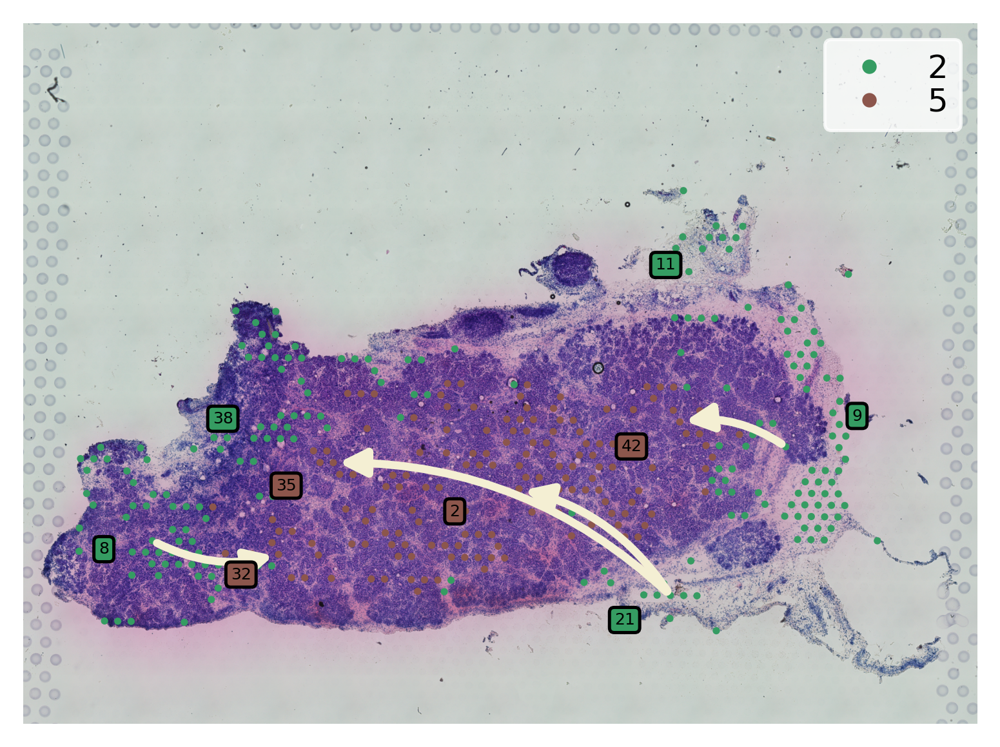

In [ ]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="louvain",list_clusters=[2,5])
st.pl.cluster_plot(adata,use_label="louvain",show_trajectories=True,list_clusters=[2,5],show_subcluster=True)

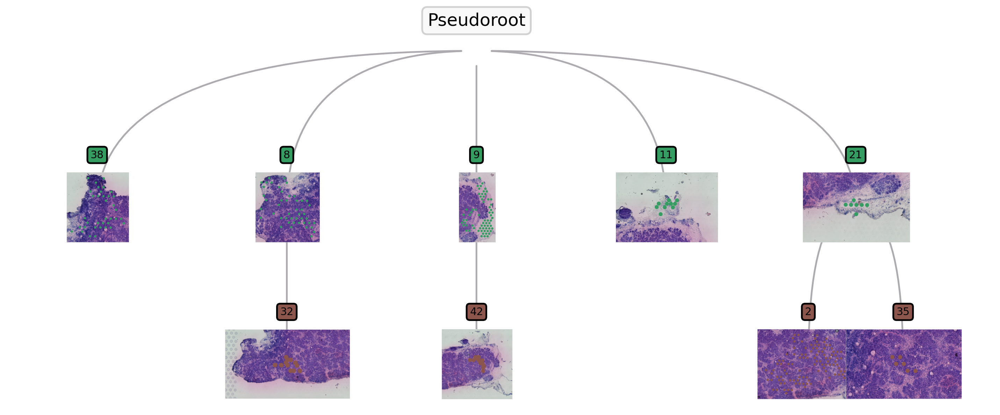

In [ ]:

st.pl.trajectory.tree_plot(adata)



In [ ]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=8,use_raw_count=False,cutoff_spearman=0.3)

Detecting the transition markers of clade_8...
Transition markers result is stored in adata.uns['clade_8']


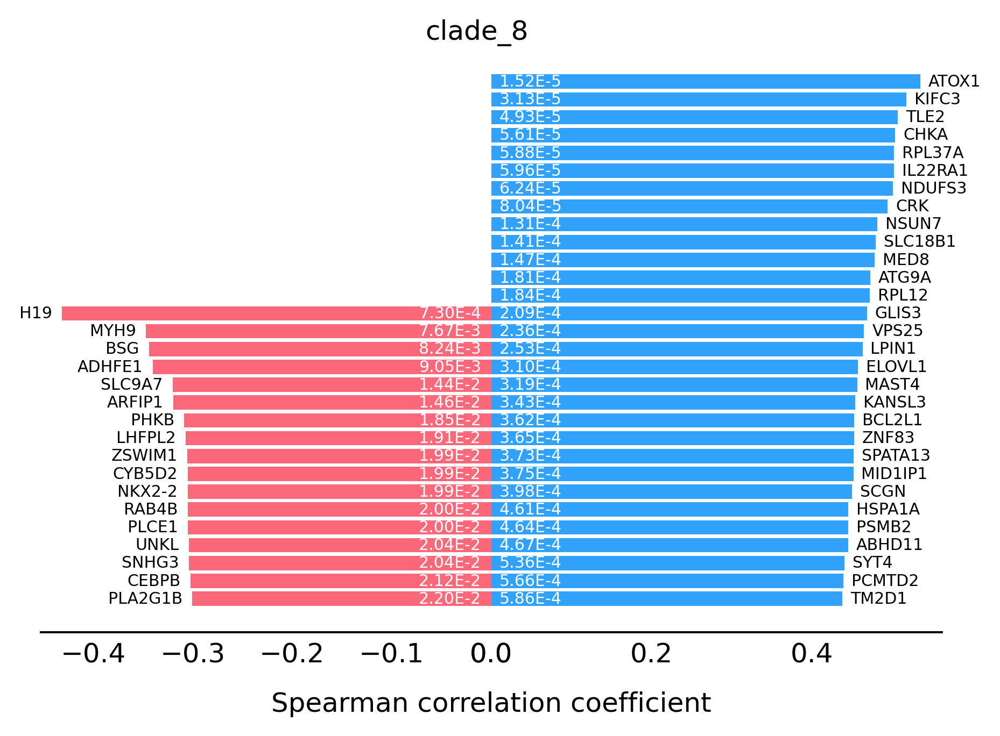

In [ ]:
st.pl.trajectory.transition_markers_plot(adata,top_genes=30,trajectory="clade_8")

In [ ]:
import openpyxl

In [ ]:
adata.uns['clade_8'].to_excel ('18PCW_clade8_output.xlsx')

In [ ]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=21,use_raw_count=False,cutoff_spearman=0.3)

Detecting the transition markers of clade_21...
Transition markers result is stored in adata.uns['clade_21']


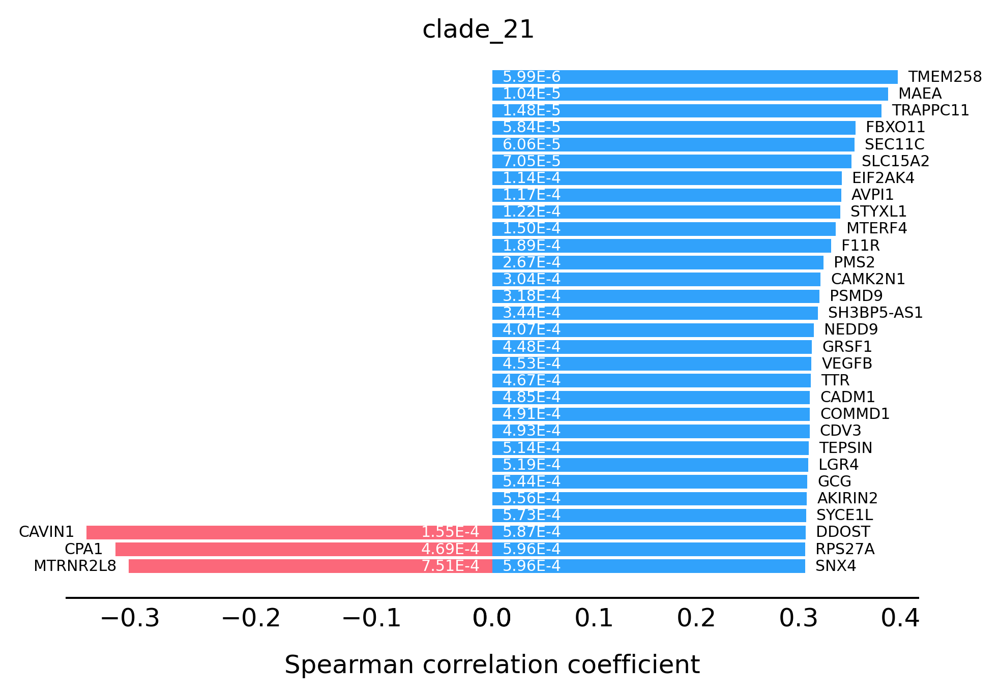

In [ ]:
st.pl.trajectory.transition_markers_plot(adata,top_genes=30,trajectory="clade_21")

In [ ]:
adata.uns['clade_21'].to_excel ('18PCW_clade21_output.xlsx')

Detecting the transition markers of clade_9...
Transition markers result is stored in adata.uns['clade_9']


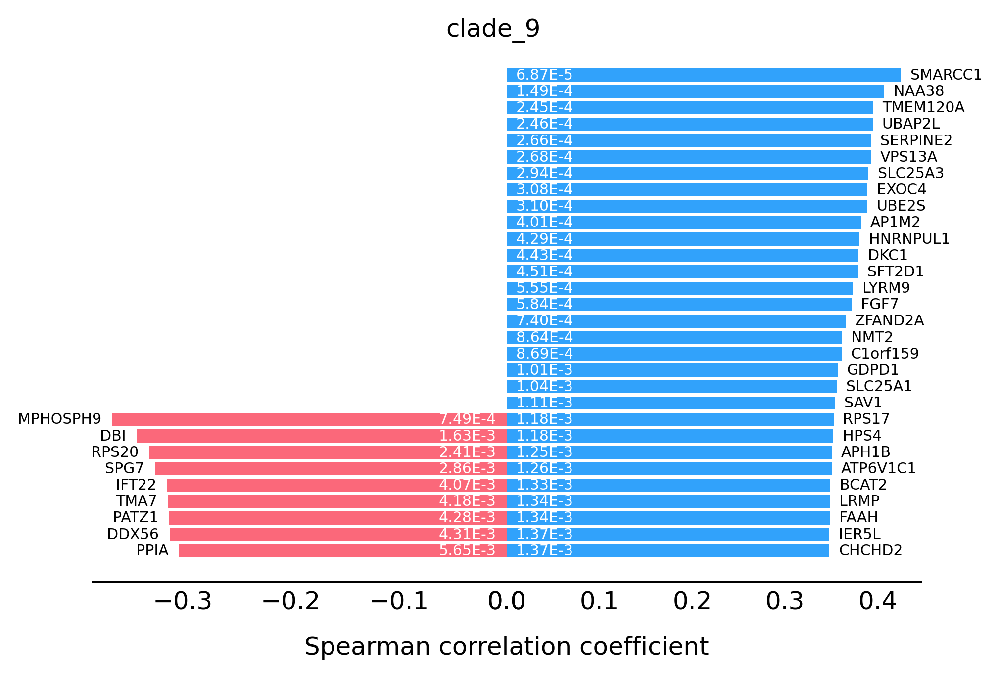

In [ ]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=9,use_raw_count=False,cutoff_spearman=0.3)
st.pl.trajectory.transition_markers_plot(adata,top_genes=30,trajectory="clade_9")

In [ ]:
adata.uns['clade_9'].to_excel ('18PCW_clade9_output14.xlsx')

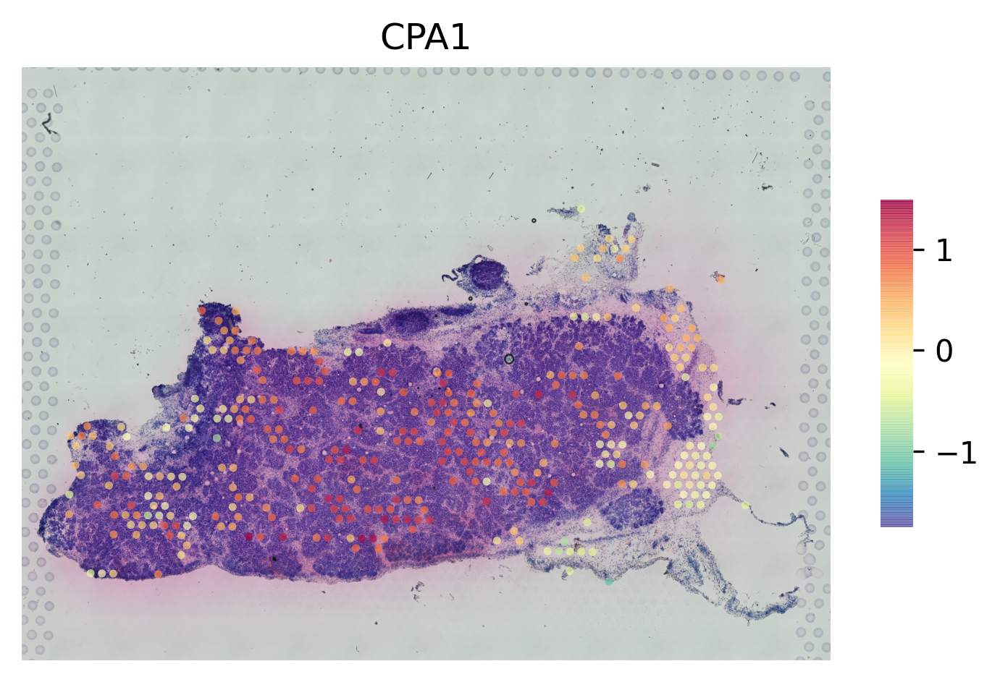

In [ ]:
st.pl.gene_plot(adata,gene_symbols="CPA1",use_label="louvain",list_clusters=[2,5])